In [1]:
import numpy as np
import cv2
import skimage
import numpy as np
import imageio.v3 as iio
import matplotlib.pyplot as plt
from skimage import color, filters, morphology, measure
from scipy.ndimage import binary_fill_holes

def apply_region_mask(frame):
    """Applies a region-based mask to a given foreground mask."""
    
    vertices1 = np.array([[160, 900], [220, 70], [1100, 140], [1045, 945]])  # Keep
    vertices2 = np.array([[150, 180], [170, 40], [535, 40], [525, 190]])  # Remove
    
    # Ensure mask has correct shape
    frame_shape = frame.shape

    # Create a mask for the region to keep
    mask1 = np.zeros(frame_shape, dtype=bool)
    rr1, cc1 = skimage.draw.polygon(vertices1[:, 1], vertices1[:, 0], mask1.shape)  # Swap x and y
    mask1[rr1, cc1] = True

    # Create a mask for the region to remove
    mask2 = np.zeros(frame_shape, dtype=bool)
    rr2, cc2 = skimage.draw.polygon(vertices2[:, 1], vertices2[:, 0], mask2.shape)  # Swap x and y
    mask2[rr2, cc2] = True

    # Create the final mask: Keep region inside vertices1, remove region inside vertices2
    final_mask = np.logical_and(mask1, ~mask2)

    # Apply the final mask to the foreground mask
    filtered_frame = np.logical_and(frame, final_mask)

    return filtered_frame

def get_foreground_mask_multiotsu(frame):
    """Compute the foreground mask by using Multi-Otsu thresholding after converting the frame to grayscale."""    
    # Convert the frame to grayscale
    with_subjects_gray = color.rgb2gray(frame)

    # Apply Multi-Otsu thresholding to the grayscale image
    thresholds = filters.threshold_multiotsu(with_subjects_gray, classes=5)  # Using 3 classes for segmentation

    # Create a mask for the foreground using the first threshold
    mask = with_subjects_gray > thresholds[1]  # Choose the second threshold for foreground (may need tuning)

    return mask

def get_canny_edges(frame, low_threshold=0.08, high_threshold=0.3, thickness=3):
    # Load frame from video or image
    frame_gray = color.rgb2gray(frame)
    
    edges = skimage.feature.canny(frame_gray, low_threshold=low_threshold, high_threshold=high_threshold)
    
    # Make edges thicker using dilation
    thick_edges = morphology.dilation(edges, morphology.disk(thickness))

    return thick_edges

def remove_small_objects_from_mask(foreground_mask, min_size=200):
    """Remove small connected components (subjects) from the foreground mask."""
    
    # Ensure the mask is boolean
    foreground_mask = foreground_mask.astype(bool)

    # Remove small objects
    cleaned_mask = morphology.remove_small_objects(foreground_mask, min_size=min_size)

    return cleaned_mask

def remove_big_objects_from_mask(foreground_mask, max_size=87000):
    """Remove big connected components (subjects) from the foreground mask."""
    # Ensure the mask is boolean
    foreground_mask = foreground_mask.astype(bool)

    # Label connected components
    labeled_mask = measure.label(foreground_mask)

    # Get region properties
    for region in measure.regionprops(labeled_mask):
        print(region.area)
        if region.area > max_size:
            labeled_mask[labeled_mask == region.label] = 0  # Remove large objects

    # Convert back to binary mask
    cleaned_mask = labeled_mask > 0

    return cleaned_mask

def fill_missing_parts(mask, closing_size=20, dilation_size=5):
    """Fill missing parts of the objects (pigs) by closing gaps and filling holes."""
    # Apply dilation first to expand object regions
    dilated_mask = morphology.dilation(mask, morphology.disk(dilation_size))

    # Apply morphological closing to close large gaps
    closed_mask = morphology.closing(dilated_mask, morphology.disk(closing_size))

    # Fill holes inside objects
    filled_mask = binary_fill_holes(closed_mask)

    return filled_mask

def merge_close_objects(foreground_mask_edges, max_area=16000, max_distance=80):
    contours, _ = cv2.findContours((foreground_mask_edges * 255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    objects = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            objects.append((cnt, (cx, cy), area))
    
    merged_contours = []
    merged = set()
    
    objects.sort(key=lambda x: x[2])  # Sort objects by area (smallest first)
    
    for i, (cnt1, (x1, y1), area1) in enumerate(objects):
        if i in merged:
            continue
        
        new_contour = cnt1.copy()
        total_area = area1
        merged.add(i)
        
        for j, (cnt2, (x2, y2), area2) in enumerate(objects[i+1:]):
            idx = i + 1 + j
            if idx in merged:
                continue
            
            dist = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)
            if dist < max_distance and (total_area + area2) <= max_area:
                new_contour = np.vstack((new_contour, cnt2))
                total_area += area2
                merged.add(idx)
                
        merged_contours.append(new_contour)
    
    # Create a new mask and draw merged contours
    merged_mask = np.zeros_like(foreground_mask_edges, dtype=np.uint8)
    cv2.drawContours(merged_mask, merged_contours, -1, 255, thickness=cv2.FILLED)

    return merged_mask

def fill_holes(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filled_mask = np.zeros_like(mask, dtype=np.uint8)
    
    for cnt in contours:
        hull = cv2.convexHull(cnt)
        cv2.drawContours(filled_mask, [hull], -1, 255, thickness=cv2.FILLED)
    
    return filled_mask

def fill_holes_and_expand(mask, dilation_thickness=5):
    # Find contours
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Create a filled mask
    filled_mask = np.zeros_like(mask, dtype=np.uint8)
    
    # Draw filled contours (convex hulls)
    for cnt in contours:
        hull = cv2.convexHull(cnt)
        cv2.drawContours(filled_mask, [hull], -1, 255, thickness=cv2.FILLED)
    
    # Perform dilation to expand the objects
    kernel = np.ones((dilation_thickness, dilation_thickness), np.uint8)
    expanded_mask = cv2.dilate(filled_mask, kernel, iterations=1)
    
    return expanded_mask

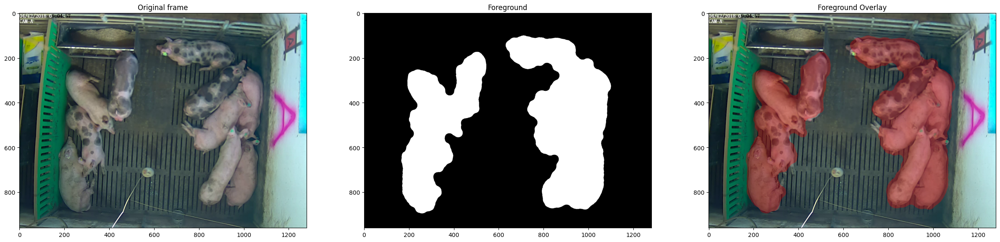

In [6]:
def get_foreground(frame):
    # Get foreground mask using Multi-Otsu thresholding
    foreground_mask = get_foreground_mask_multiotsu(frame)
    
    # Get edges using Canny Edge Detector
    edge_map = get_canny_edges(frame, thickness=5)
    
    # Remove the irrelevant regions of the frame by combining the foreground mask with the inverse of the edge map
    relevant_area_mask = apply_region_mask(np.logical_and(foreground_mask, ~edge_map))
    
    # Remove small objects in the relevant area
    cleaned_relevant_area = remove_small_objects_from_mask(relevant_area_mask, min_size=200)
    
    # Merge close objects based on area and distance criteria
    merged_objects_step_1 = merge_close_objects(cleaned_relevant_area, max_area=24000, max_distance=150)
    
    # Once again, merge close objects for further refinement
    merged_objects_step_2 = merge_close_objects(merged_objects_step_1, max_area=24000, max_distance=200)
    
    # Fill holes and expand objects for better coverage
    # filled_and_expanded_objects = fill_holes_and_expand(merged_objects_step_2, dilation_thickness=20)
    filled_and_expanded_objects = fill_missing_parts(merged_objects_step_2, closing_size=20, dilation_size=20)
    
    # Remove any remaining small objects as a final step
    final_foreground_mask = remove_small_objects_from_mask(filled_and_expanded_objects, min_size=5000)
    
    return final_foreground_mask

# Paths to frame
video_path = "/data/bioeng/pigs/videosPenA_2018_12_04_9h04_12h14/1_Manual Record_2018-12-04 09-04-54_2018-12-04 09-17-31.mp4"
frame_index = 100

frame = iio.imread(video_path, index=frame_index)

foreground_mask = get_foreground(frame)


# Convert foreground mask to a 3-channel RGB image with red color
foreground_rgb = np.zeros_like(frame)  # Create an empty RGB image with the same shape as the frame
foreground_rgb[:, :, 0] = foreground_mask * 255  # Apply the red color (R channel)

# Create an overlay with some transparency (alpha)
alpha = 0.3
overlay = np.copy(frame)

# Only apply the foreground (red color) where the mask is True
overlay[foreground_mask] = (overlay[foreground_mask] * (1 - alpha) + foreground_rgb[foreground_mask] * alpha).astype(np.uint8)

# Display results
fig, ax = plt.subplots(1, 3, figsize=(30, 15))
ax[0].imshow(frame)
ax[0].set_title("Original frame")

ax[1].imshow(foreground_mask, cmap='gray')
ax[1].set_title("Foreground")

ax[2].imshow(overlay)
ax[2].set_title("Foreground Overlay")

plt.show()

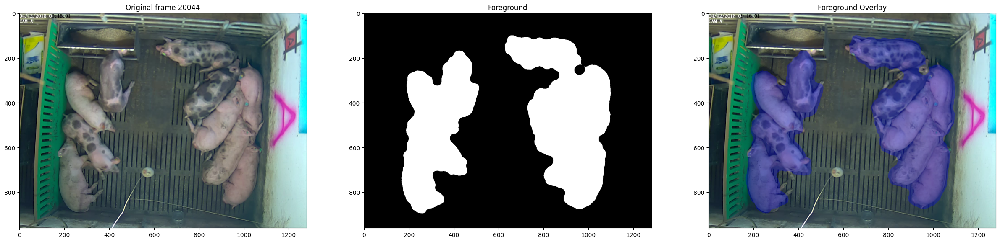

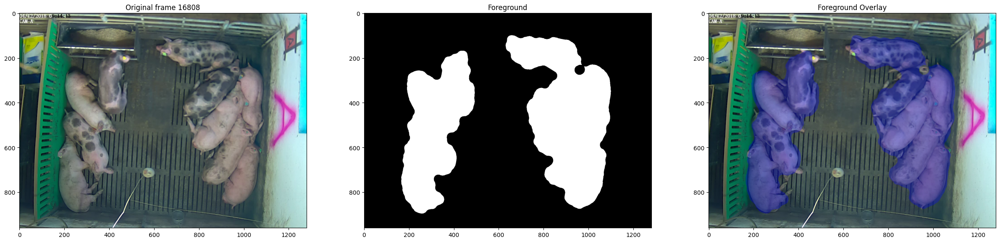

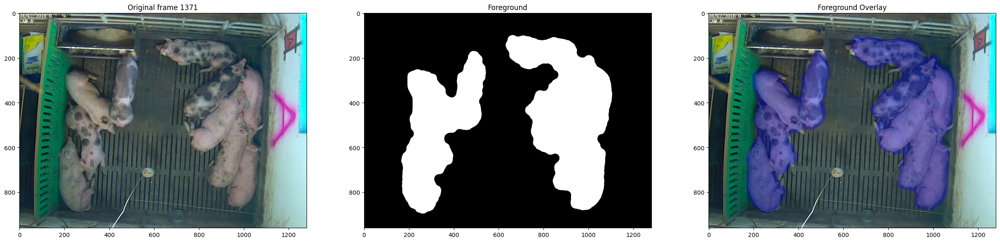

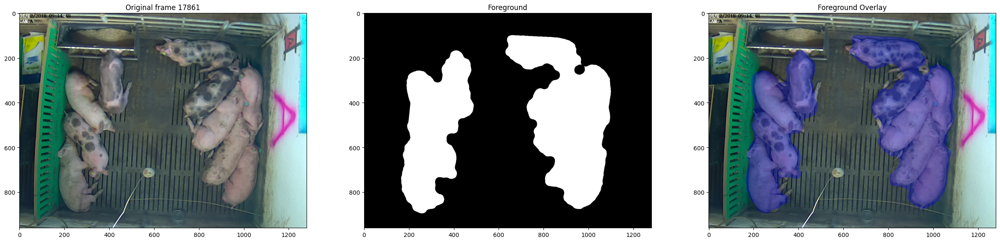

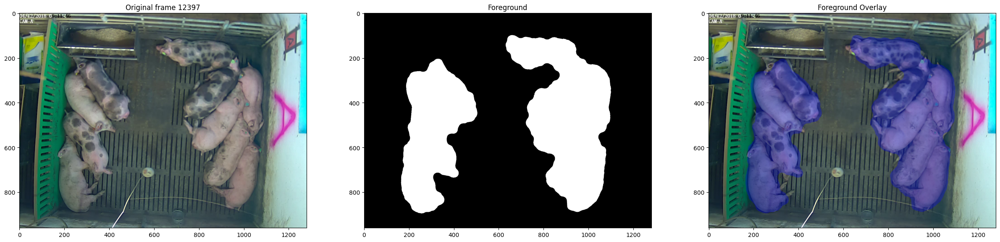

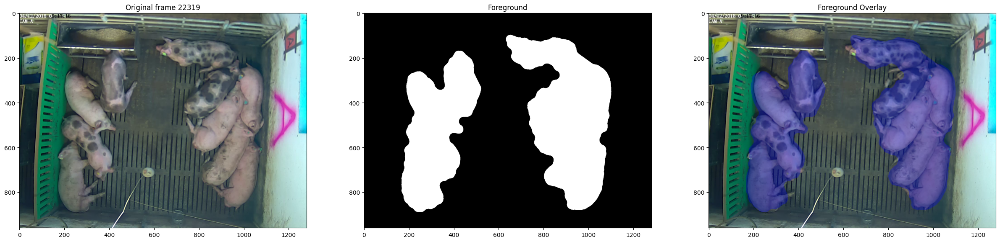

KeyboardInterrupt: 

In [7]:
import random

# Path to your video
video_path = "/data/bioeng/pigs/videosPenA_2018_12_04_9h04_12h14/1_Manual Record_2018-12-04 09-04-54_2018-12-04 09-17-31.mp4"

# Open the video
vid = cv2.VideoCapture(video_path)

# Get total number of frames in the video
total_frames = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))

# Get 10 random frames from the video
random_frames = random.sample(range(total_frames), 10)

# Process each random frame
for frame_index in random_frames:
    # Read the frame at frame_index
    vid.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
    ret, frame = vid.read()

    if ret:
        # Get the foreground mask
        foreground_mask = get_foreground(frame)
        
        # Convert foreground mask to a 3-channel RGB image with red color
        foreground_rgb = np.zeros_like(frame)  # Create an empty RGB image with the same shape as the frame
        foreground_rgb[:, :, 0] = foreground_mask * 255  # Apply the red color (R channel)

        # Create an overlay with some transparency (alpha)
        alpha = 0.3
        overlay = np.copy(frame)

        # Only apply the foreground (red color) where the mask is True
        overlay[foreground_mask] = (overlay[foreground_mask] * (1 - alpha) + foreground_rgb[foreground_mask] * alpha).astype(np.uint8)

        # Display results for the current frame
        fig, ax = plt.subplots(1, 3, figsize=(30, 15))
        ax[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        ax[0].set_title(f"Original frame {frame_index}")

        ax[1].imshow(foreground_mask, cmap='gray')
        ax[1].set_title("Foreground")

        ax[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        ax[2].set_title("Foreground Overlay")

        plt.show()

# Release the video capture object
vid.release()

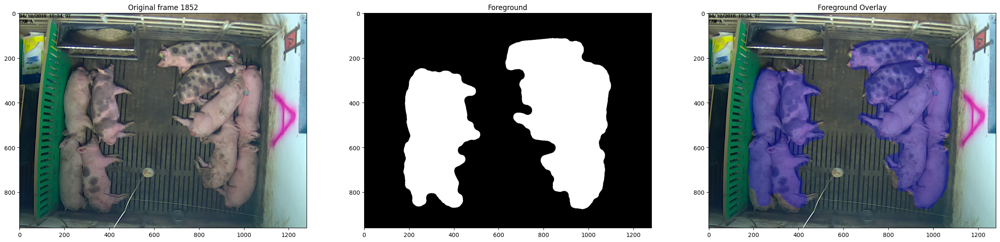

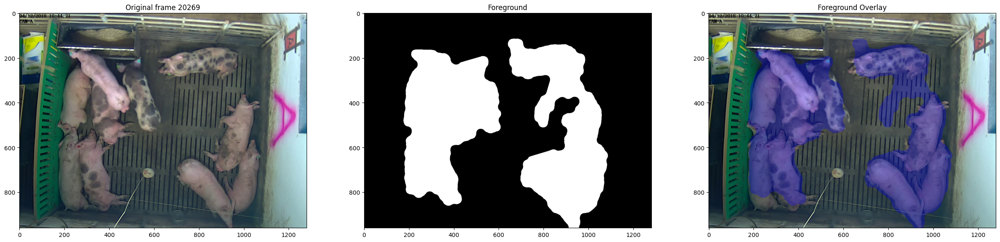

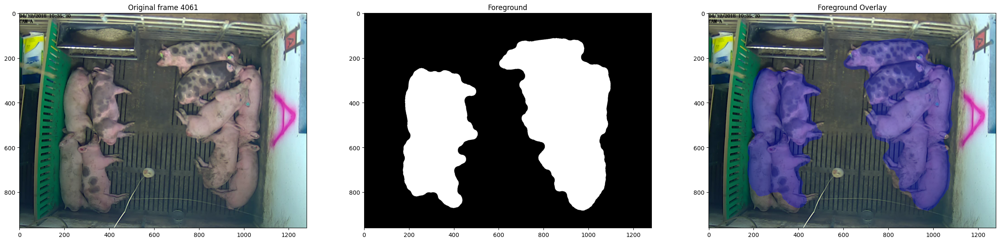

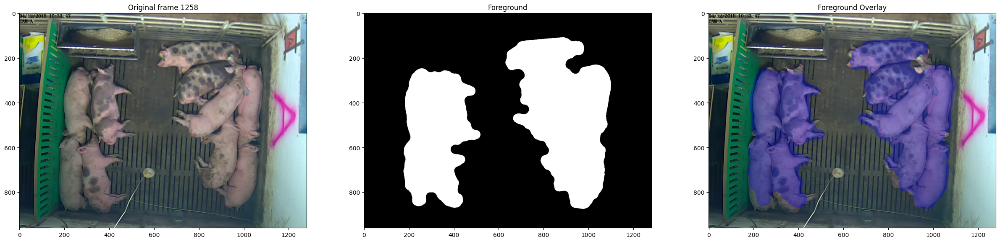

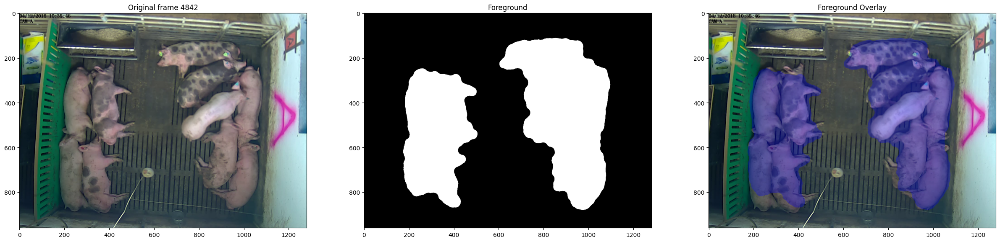

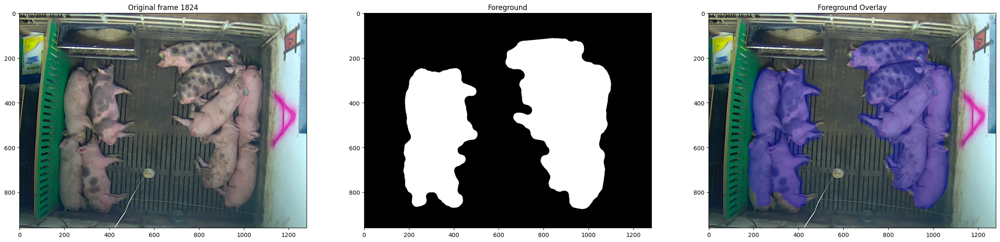

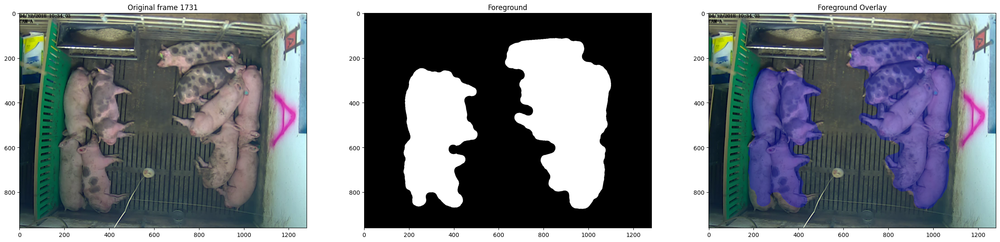

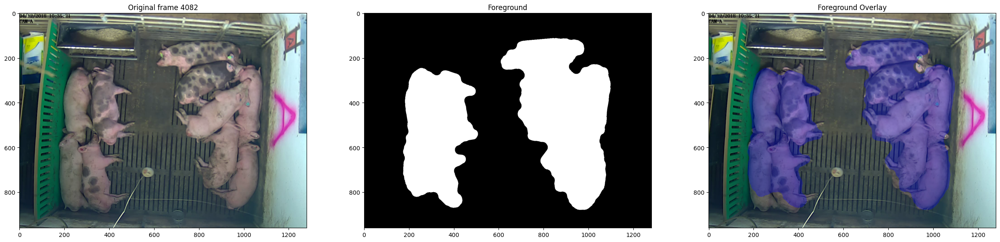

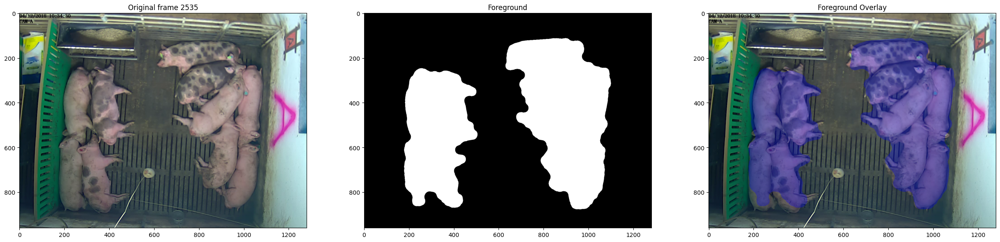

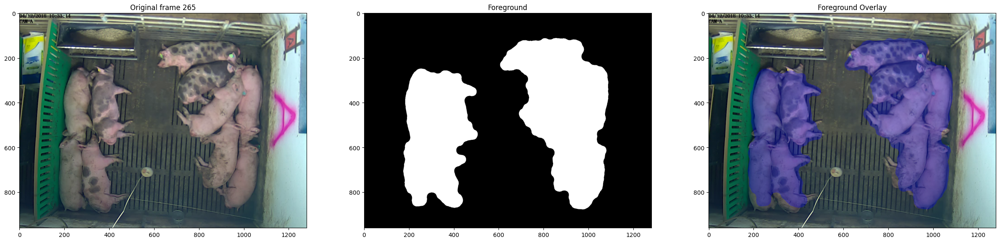

In [8]:
import random

# Path to your video
video_path = "/data/bioeng/pigs/videosPenA_2018_12_04_9h04_12h14/1_Manual Record_2018-12-04 10-33-06_2018-12-04 10-45-42.mp4"

# Open the video
vid = cv2.VideoCapture(video_path)

# Get total number of frames in the video
total_frames = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))

# Get 10 random frames from the video
random_frames = random.sample(range(total_frames), 10)

# Process each random frame
for frame_index in random_frames:
    # Read the frame at frame_index
    vid.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
    ret, frame = vid.read()

    if ret:
        # Get the foreground mask
        foreground_mask = get_foreground(frame)
        
        # Convert foreground mask to a 3-channel RGB image with red color
        foreground_rgb = np.zeros_like(frame)  # Create an empty RGB image with the same shape as the frame
        foreground_rgb[:, :, 0] = foreground_mask * 255  # Apply the red color (R channel)

        # Create an overlay with some transparency (alpha)
        alpha = 0.3
        overlay = np.copy(frame)

        # Only apply the foreground (red color) where the mask is True
        overlay[foreground_mask] = (overlay[foreground_mask] * (1 - alpha) + foreground_rgb[foreground_mask] * alpha).astype(np.uint8)

        # Display results for the current frame
        fig, ax = plt.subplots(1, 3, figsize=(30, 15))
        ax[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        ax[0].set_title(f"Original frame {frame_index}")

        ax[1].imshow(foreground_mask, cmap='gray')
        ax[1].set_title("Foreground")

        ax[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        ax[2].set_title("Foreground Overlay")

        plt.show()

# Release the video capture object
vid.release()

In [ ]:
import random

# Path to your video
video_path = "/data/bioeng/pigs/videosPenA_2018_12_04_9h04_12h14.avi"

# Open the video
vid = cv2.VideoCapture(video_path)

# Get total number of frames in the video
total_frames = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))

# Get 10 random frames from the video
random_frames = random.sample(range(total_frames), 10)

# Process each random frame
for frame_index in random_frames:
    # Read the frame at frame_index
    vid.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
    ret, frame = vid.read()

    if ret:
        # Get the foreground mask
        foreground_mask = get_foreground(frame)
        
        # Convert foreground mask to a 3-channel RGB image with red color
        foreground_rgb = np.zeros_like(frame)  # Create an empty RGB image with the same shape as the frame
        foreground_rgb[:, :, 0] = foreground_mask * 255  # Apply the red color (R channel)

        # Create an overlay with some transparency (alpha)
        alpha = 0.3
        overlay = np.copy(frame)

        # Only apply the foreground (red color) where the mask is True
        overlay[foreground_mask] = (overlay[foreground_mask] * (1 - alpha) + foreground_rgb[foreground_mask] * alpha).astype(np.uint8)

        # Display results for the current frame
        fig, ax = plt.subplots(1, 3, figsize=(30, 15))
        ax[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        ax[0].set_title(f"Original frame {frame_index}")

        ax[1].imshow(foreground_mask, cmap='gray')
        ax[1].set_title("Foreground")

        ax[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        ax[2].set_title("Foreground Overlay")

        plt.show()

# Release the video capture object
vid.release()